<h1>The Battle of the Neighborhoods - Week 2 </h1>

<h3>A. Download and Explore New York city geographical coordinates dataset</h3>
Neighborhood has a total of 5 boroughs and 306 neighborhoods. In order to segement the neighborhoods and explore them, we will essentially need a dataset that contains the 5 boroughs and the neighborhoods that exist in each borough as well as the the latitude and logitude coordinates of each neighborhood.

Luckily, this dataset exists for free on the web. Link to the dataset: https://geo.nyu.edu/catalog/nyu_2451_34572

First, let's download all the dependencies that we will need.

In [3]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

import csv # implements classes to read and write tabular data in CSV form

print('Libraries imported.')

Solving environment: done

## Package Plan ##

  environment location: /home/jupyterlab/conda/envs/python

  added / updated specs:
    - geopy


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    geographiclib-1.50         |             py_0          34 KB  conda-forge
    geopy-1.22.0               |     pyh9f0ad1d_0          63 KB  conda-forge
    ------------------------------------------------------------
                                           Total:          97 KB

The following NEW packages will be INSTALLED:

  geographiclib      conda-forge/noarch::geographiclib-1.50-py_0
  geopy              conda-forge/noarch::geopy-1.22.0-pyh9f0ad1d_0



geopy-1.22.0         | 63 KB     | ##################################### | 100% 
geographiclib-1.50   | 34 KB     | ##################################### | 100% 
Preparing transaction: done
Verifying transaction: done
Executing transaction: 

In [4]:
!wget -q -O 'newyork_data.json' https://ibm.box.com/shared/static/fbpwbovar7lf8p5sgddm06cgipa2rxpe.json
print('Data downloaded!')

Data downloaded!


<b>Load and explore data</b>

In [5]:
with open('newyork_data.json') as json_data:
    newyork_data = json.load(json_data)

In [6]:
neighborhoods_data = newyork_data['features']

In [7]:
neighborhoods_data[0]

{'type': 'Feature',
 'id': 'nyu_2451_34572.1',
 'geometry': {'type': 'Point',
  'coordinates': [-73.84720052054902, 40.89470517661]},
 'geometry_name': 'geom',
 'properties': {'name': 'Wakefield',
  'stacked': 1,
  'annoline1': 'Wakefield',
  'annoline2': None,
  'annoline3': None,
  'annoangle': 0.0,
  'borough': 'Bronx',
  'bbox': [-73.84720052054902,
   40.89470517661,
   -73.84720052054902,
   40.89470517661]}}

<h3> Transform data into Panda dataframe</h3>

In [8]:
# define the dataframe columns
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
neighborhoods = pd.DataFrame(columns=column_names)

In [9]:
neighborhoods

,Borough,Neighborhood,Latitude,Longitude


<b>Loop in the Data one row at a time</b>

In [10]:

for data in neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    neighborhoods = neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

In [11]:
neighborhoods.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [12]:
print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(neighborhoods['Borough'].unique()),
        neighborhoods.shape[0]
    )
)

The dataframe has 5 boroughs and 306 neighborhoods.


In [13]:
neighborhoods.to_csv('BON1_NYC_GEO.csv',index=False)

<b>Use geopy library to get the latitude and longitude values of New York City</b>

In [14]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent="Jupyter")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


<h3><b>Create a map of New York with neighborhoods superimposed on top.</b></h3>

In [15]:
# create map of Toronto using latitude and longitude values
map_NewYork = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(neighborhoods['Latitude'], neighborhoods['Longitude'], neighborhoods['Borough'], neighborhoods['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_NewYork)  
    
map_NewYork

<h2>B. Web scrapping of Population data of New York city from Wikipedia </h2>
<h3>POPULATION DATA</h3>
<b>Web scrapping of Population data from wikipedia page - https://en.wikipedia.org/wiki/New_York_City</b>

In [12]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt

!pip install BeautifulSoup4
from bs4 import BeautifulSoup # package for parsing HTML and XML documents

import csv # implements classes to read and write tabular data in CSV form

print('Libraries imported.')

Solving environment: done

# All requested packages already installed.

     |████████████████████████████████| 122kB 6.6MB/s eta 0:00:01
Libraries imported.


<h3>Web scrapping of Population data from wikipedia page using BeautifulSoup.</h3>
Beautiful Soup is a Python package for parsing HTML and XML documents (including having malformed markup, i.e. non-closed tags, so named after tag soup). It creates a parse tree for parsed pages that can be used to extract data from HTML, which is useful for web scraping.

In [13]:
!pip install lxml

html = requests.get('https://en.wikipedia.org/wiki/Demographics_of_New_York_City').text
soup = BeautifulSoup(html, 'html.parser')
table = soup.find('table',{'class':'wikitable sortable'})
#print(soup.prettify())

headers = [header.text for header in table.find_all('th')]

table_rows = table.find_all('tr')        
rows = []
for row in table_rows:
   td = row.find_all('td')
   row = [row.text for row in td]
   rows.append(row)

with open('BON2_POPULATION1.csv', 'w') as f:
   writer = csv.writer(f)
   writer.writerow(headers)
   writer.writerows(row for row in rows if row)

In [14]:
Pop_data=pd.read_csv('BON2_POPULATION1.csv')
Pop_data.drop(Pop_data.columns[[7,8,9,10,11]], axis=1,inplace=True)
print('Data downloaded!')

Data downloaded!


In [15]:
Pop_data.columns = Pop_data.columns.str.replace(' ', '')
Pop_data.columns = Pop_data.columns.str.replace('\'','')
Pop_data.rename(columns={'Borough':'persons_sq_mi','Country':'persons_sq_km'}, inplace=True)
Pop_data

,NewYorkCitysfiveboroughsvte\n,Jurisdiction\n,Population\n,GrossDomesticProduct\n,Landarea\n,Density\n,persons_sq_mi,squarekm,persons/sq.mi,persons/km2\n
0,The Bronx\n,\n Bronx\n,"1,418,207\n",42.695\n,"30,100\n",42.10\n,109.04\n,NaN,NaN,NaN
1,Brooklyn\n,\n Kings\n,"2,559,903\n",91.559\n,"35,800\n",70.82\n,183.42\n,NaN,NaN,NaN
2,Manhattan\n,\n New York\n,"1,628,706\n",600.244\n,"368,500\n",22.83\n,59.13\n,NaN,NaN,NaN
3,Queens\n,\n Queens\n,"2,253,858\n",93.310\n,"41,400\n",108.53\n,281.09\n,NaN,NaN,NaN
4,Staten Island\n,\n Richmond\n,"476,143\n",14.514\n,"30,500\n",58.37\n,151.18\n,NaN,NaN,NaN
5,City of New York,"8,336,817",842.343,"101,000",302.64,783.83,"27,547",NaN,NaN,NaN
6,State of New York,"19,453,561","1,731.910","89,000","47,214","122,284",412,NaN,NaN,NaN
7,Sources:[14] and see individual borough articl...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
Pop_data.rename(columns = {'NewYorkCitysfiveboroughsvte\n' : 'Borough',
                   'Jurisdiction\n':'Country',
                   'Population\n':'Estimate_2017', 
                   'Landarea\n':'square_miles',
                    'GrossDomesticProduct\n':'Production',
                    'Density\n':'square_km',
                    'persons/km2\n':'persons/km2'}, inplace=True)
Pop_data

,Borough,Country,Estimate_2017,Production,square_miles,square_km,persons_sq_mi,squarekm,persons/sq.mi,persons/km2
0,The Bronx\n,\n Bronx\n,"1,418,207\n",42.695\n,"30,100\n",42.10\n,109.04\n,NaN,NaN,NaN
1,Brooklyn\n,\n Kings\n,"2,559,903\n",91.559\n,"35,800\n",70.82\n,183.42\n,NaN,NaN,NaN
2,Manhattan\n,\n New York\n,"1,628,706\n",600.244\n,"368,500\n",22.83\n,59.13\n,NaN,NaN,NaN
3,Queens\n,\n Queens\n,"2,253,858\n",93.310\n,"41,400\n",108.53\n,281.09\n,NaN,NaN,NaN
4,Staten Island\n,\n Richmond\n,"476,143\n",14.514\n,"30,500\n",58.37\n,151.18\n,NaN,NaN,NaN
5,City of New York,"8,336,817",842.343,"101,000",302.64,783.83,"27,547",NaN,NaN,NaN
6,State of New York,"19,453,561","1,731.910","89,000","47,214","122,284",412,NaN,NaN,NaN
7,Sources:[14] and see individual borough articl...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [17]:
Pop_data['Borough']=Pop_data['Borough'].replace(to_replace='\n', value='', regex=True)
Pop_data['Country']=Pop_data['Country'].replace(to_replace='\n', value='', regex=True)
Pop_data['Estimate_2017']=Pop_data['Estimate_2017'].replace(to_replace='\n', value='', regex=True)
Pop_data['Production']=Pop_data['Production'].replace(to_replace='\n', value='', regex=True)
Pop_data['square_miles']=Pop_data['square_miles'].replace(to_replace='\n', value='', regex=True)
Pop_data['square_km']=Pop_data['square_km'].replace(to_replace='\n', value='', regex=True)
Pop_data['persons_sq_mi']=Pop_data['persons_sq_mi'].replace(to_replace='\n', value='', regex=True)
Pop_data['persons/km2']=Pop_data['persons/km2'].replace(to_replace='\n', value='', regex=True)
Pop_data

,Borough,Country,Estimate_2017,Production,square_miles,square_km,persons_sq_mi,squarekm,persons/sq.mi,persons/km2
0,The Bronx,Bronx,"1,418,207",42.695,"30,100",42.10,109.04,NaN,NaN,NaN
1,Brooklyn,Kings,"2,559,903",91.559,"35,800",70.82,183.42,NaN,NaN,NaN
2,Manhattan,New York,"1,628,706",600.244,"368,500",22.83,59.13,NaN,NaN,NaN
3,Queens,Queens,"2,253,858",93.310,"41,400",108.53,281.09,NaN,NaN,NaN
4,Staten Island,Richmond,"476,143",14.514,"30,500",58.37,151.18,NaN,NaN,NaN
5,City of New York,"8,336,817",842.343,"101,000",302.64,783.83,"27,547",NaN,NaN,NaN
6,State of New York,"19,453,561","1,731.910","89,000","47,214","122,284",412,NaN,NaN,NaN
7,Sources:[14] and see individual borough articles,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [27]:
Pop_data

,Borough,Country,Estimate_2017,Production,square_miles,square_km,persons_sq_mi
0,The Bronx,Bronx,"1,418,207",42.695,"30,100",42.10,109.04
1,Brooklyn,Kings,"2,559,903",91.559,"35,800",70.82,183.42
2,Manhattan,New York,"1,628,706",600.244,"368,500",22.83,59.13
3,Queens,Queens,"2,253,858",93.310,"41,400",108.53,281.09
4,Staten Island,Richmond,"476,143",14.514,"30,500",58.37,151.18
5,City of New York,"8,336,817",842.343,"101,000",302.64,783.83,"27,547"
6,State of New York,"19,453,561","1,731.910","89,000","47,214","122,284",412
7,Sources:[14] and see individual borough articles,NaN,NaN,NaN,NaN,NaN,NaN


<b>Remove NAN</b>

In [28]:
Pop_data = Pop_data.fillna('')
Pop_data

,Borough,Country,Estimate_2017,Production,square_miles,square_km,persons_sq_mi
0,The Bronx,Bronx,"1,418,207",42.695,"30,100",42.10,109.04
1,Brooklyn,Kings,"2,559,903",91.559,"35,800",70.82,183.42
2,Manhattan,New York,"1,628,706",600.244,"368,500",22.83,59.13
3,Queens,Queens,"2,253,858",93.310,"41,400",108.53,281.09
4,Staten Island,Richmond,"476,143",14.514,"30,500",58.37,151.18
5,City of New York,"8,336,817",842.343,"101,000",302.64,783.83,"27,547"
6,State of New York,"19,453,561","1,731.910","89,000","47,214","122,284",412
7,Sources:[14] and see individual borough articles,,,,,,


<b>Drop the Last Row</b>

In [32]:
i = Pop_data[((Pop_data.Borough == 'Sources:[14] and see individual borough articles'))].index
Pop_data.drop(i)

,Borough,Country,Estimate_2017,Production,square_miles,square_km,persons_sq_mi
0,The Bronx,Bronx,"1,418,207",42.695,"30,100",42.10,109.04
1,Brooklyn,Kings,"2,559,903",91.559,"35,800",70.82,183.42
2,Manhattan,New York,"1,628,706",600.244,"368,500",22.83,59.13
3,Queens,Queens,"2,253,858",93.310,"41,400",108.53,281.09
4,Staten Island,Richmond,"476,143",14.514,"30,500",58.37,151.18
5,City of New York,"8,336,817",842.343,"101,000",302.64,783.83,"27,547"
6,State of New York,"19,453,561","1,731.910","89,000","47,214","122,284",412


<b>Save Dataframe as csv file</b>

In [33]:
Pop_data.to_csv('BON2_POPULATION.csv',index=False)

<h3>C. Download and Explore Farmers Market dataset</h3>

In [1]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
from matplotlib.ticker import NullFormatter
import matplotlib.ticker as ticker

# notice: installing seaborn might takes a few minutes
!conda install -c anaconda seaborn -y
import seaborn as sns

!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

print('Libraries imported.')

Solving environment: done

## Package Plan ##

  environment location: /home/jupyterlab/conda/envs/python

  added / updated specs:
    - geopy


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    geographiclib-1.50         |             py_0          34 KB  conda-forge
    geopy-1.22.0               |     pyh9f0ad1d_0          63 KB  conda-forge
    ------------------------------------------------------------
                                           Total:          97 KB

The following NEW packages will be INSTALLED:

  geographiclib      conda-forge/noarch::geographiclib-1.50-py_0
  geopy              conda-forge/noarch::geopy-1.22.0-pyh9f0ad1d_0



geopy-1.22.0         | 63 KB     | ##################################### | 100% 
geographiclib-1.50   | 34 KB     | ##################################### | 100% 
Preparing transaction: done
Verifying transaction: done
Executing transaction: 

In [4]:
FM_NYC=pd.read_csv("DOHMH_Farmers_Markets.csv")

In [5]:
FM_NYC.head()

,Borough,Market Name,Street Address,Latitude,Longitude,Days of Operation,Hours of Operations,Season Dates,Accepts EBT,Open Year-Round,Stellar Cooking Demonstrations,Food Activities for Kids,Location Point
0,Brooklyn,Woodhull Hospital Youthmarket,Broadway & Flushing Ave,40.700726,-73.941932,Wednesday,9 a.m. - 2 p.m.,07/10/2019-11/27/2019,Yes,No,No,No,"(40.700726, -73.941932)"
1,Manhattan,Mount Sinai Hospital Greenmarket,E 99th St bet Madison & Park Aves,40.789169,-73.952743,Wednesday,8 a.m. - 5 p.m.,06/12/19-11/27/19,Yes,No,No,No,"(40.789169, -73.952743)"
2,Bronx,170 Farm Stand,E 170th St & Townsend Ave,40.839882,-73.916783,Wednesday,2:30 - 6:30 p.m.,07/10/2019-11/27/2019,Yes,No,No,Yes,"(40.839882, -73.916783)"
3,Manhattan,Greenmarket at Oculus Plaza,"Church & Fulton Sts, on Oculus Plaza",40.711535,-74.010464,Tuesday,7 a.m. - 7 p.m.,07/09/2019-11/30/19,Yes,Yes,No,No,"(40.711535, -74.010464)"
4,Queens,Ditmars Park Youthmarket,"Steinway St bet Ditmars Blvd & 23rd Ave, at Di...",40.772854,-73.906061,Saturday,8 a.m. - 3 p.m.,07/13/2019-11/23/2019,Yes,No,No,No,"(40.772854, -73.906061)"


<h5>Check the shop that is open year round</h5>

In [6]:
FM_NYC.rename(columns={'Open Year-Round':'Open_Year_Round'}, inplace=True)
print(FM_NYC.Open_Year_Round.unique())

['No' 'Yes' 'Yes (W)']


In [7]:
FM_NYC['Open_Year_Round'].value_counts().to_frame()

,Open_Year_Round
No,109
Yes,28
Yes (W),1


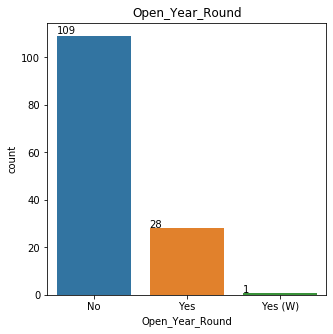

In [8]:
fig,ax = plt.subplots(1, 1, figsize=(5, 5))
sns.countplot(x='Open_Year_Round',data=FM_NYC)
ax.set_title("Open_Year_Round")
for t in ax.patches:
    if (np.isnan(float(t.get_height()))):
        ax.annotate('', (t.get_x(), 0))
    else:
        ax.annotate(str(format(int(t.get_height()), ',d')), (t.get_x(), t.get_height()*1.01))
    
plt.show();

In [9]:
# FM_NYC_filtered - Dataset with only Open_Year_Round=Yes
FM_NYC_filtered = FM_NYC[FM_NYC['Open_Year_Round'] == 'Yes'].copy()
FM_NYC_filtered ['Borough'] = FM_NYC_filtered['Borough'].map(lambda x: x.strip())
print(FM_NYC_filtered.shape)
FM_NYC_filtered.head()

(28, 13)


,Borough,Market Name,Street Address,Latitude,Longitude,Days of Operation,Hours of Operations,Season Dates,Accepts EBT,Open_Year_Round,Stellar Cooking Demonstrations,Food Activities for Kids,Location Point
3,Manhattan,Greenmarket at Oculus Plaza,"Church & Fulton Sts, on Oculus Plaza",40.711535,-74.010464,Tuesday,7 a.m. - 7 p.m.,07/09/2019-11/30/19,Yes,Yes,No,No,"(40.711535, -74.010464)"
9,Brooklyn,Fort Greene Park Greenmarket,Washington Park bet Dekalb Ave & Willoughby St,40.691707,-73.973539,Saturday,8 a.m. - 3 p.m.,Year-Round,Yes,Yes,No,No,"(40.691707, -73.973539)"
15,Manhattan,Tucker Square Greenmarket,W 66th St & Broadway,40.773876,-73.982226,Thursday & Saturday,8 a.m. - 5 p.m.,Year-Round (Closed 07/04/19 & 11/28/19 - open ...,Yes,Yes,No,No,"(40.773876, -73.982226)"
20,Brooklyn,McCarren Park Greenmarket,Union Ave bet Driggs and N 12th Sts,40.719219,-73.952479,Saturday,8 a.m. - 2 p.m.,Year-Round,Yes,Yes,No,No,"(40.719219, -73.952479)"
21,Manhattan,Bowling Green Greenmarket,Broadway & Battery Pl,40.704549,-74.014290,Tuesday &\nThursday,8 a.m. - 5 p.m.,Year-Round (Closed 07/04/19 & 11/28/19- open 1...,Yes,Yes,No,No,"(40.704549, -74.01429)"


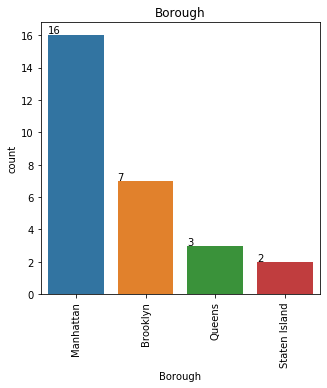

In [10]:
fig,ax = plt.subplots(1, 1, figsize=(5, 5))
sns.countplot(x='Borough',data=FM_NYC_filtered)
ax.set_title("Borough")
for t in ax.patches:
    if (np.isnan(float(t.get_height()))):
        ax.annotate('', (t.get_x(), 0))
    else:
        ax.annotate(str(format(int(t.get_height()), ',d')), (t.get_x(), t.get_height()*1.01))
        ax.set_xticklabels([t.get_text().split("T")[0] for t in ax.get_xticklabels()])

# This sets the yticks "upright" with 0, as opposed to sideways with 90.
plt.xticks(rotation=90) 
plt.show()

<h4>Manhattan amd Brooklyn has highest numbers of Farmers Markets that Open Year Round</h4>

Finding the NYC coordinate

In [12]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent="Jupyter")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


In [14]:
# create map of New York City using latitude and longitude values
map_markets = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, FacilityName, borough in zip(FM_NYC_filtered['Latitude'], FM_NYC_filtered['Longitude'], FM_NYC_filtered['Market Name'], FM_NYC_filtered['Borough']):
            label = '{}, {}'.format(FacilityName, borough)
            label = folium.Popup(label, parse_html=True)
            folium.CircleMarker(
                [lat, lng],
                radius=5,
                popup=label,
                color='green',
                fill=True,
                fill_color='green',
                fill_opacity=0.7,
                parse_html = False).add_to(map_markets)  

map_markets



<h1>D. Segmenting and Clustering Neighborhoods - Brooklyn and Manhattan</h1>
<h3>Introduction</h3>
In this section of the capstone project, we will use the Foursquare API to explore neighborhoods in Brooklyn and Manhattan. We will use the explore function to get the most common venue categories in each neighborhood, and then use this feature to group the neighborhoods into clusters. We will use the k-means clustering algorithm to complete this task. Finally, we will use the Folium library to visualize the neighborhoods in Brooklyn and Manhattan and their emerging clusters.

<h5>Table of Contents</h5>

1. Download and Explore Dataset

2. Explore Neighborhoods in Brooklyn and Manhattan

3. Analyze Each Neighborhood

4. Cluster Neighborhoods and Examine Clusters

Download all the dependencies that are needed.

In [1]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt

# import k-means from clustering stage
from sklearn.cluster import KMeans

from sklearn.metrics import silhouette_score

!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

print('Libraries imported.')

Solving environment: done

## Package Plan ##

  environment location: /home/jupyterlab/conda/envs/python

  added / updated specs:
    - geopy


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    geographiclib-1.50         |             py_0          34 KB  conda-forge
    geopy-1.22.0               |     pyh9f0ad1d_0          63 KB  conda-forge
    ------------------------------------------------------------
                                           Total:          97 KB

The following NEW packages will be INSTALLED:

  geographiclib      conda-forge/noarch::geographiclib-1.50-py_0
  geopy              conda-forge/noarch::geopy-1.22.0-pyh9f0ad1d_0



geopy-1.22.0         | 63 KB     | ##################################### | 100% 
geographiclib-1.50   | 34 KB     | ##################################### | 100% 
Preparing transaction: done
Verifying transaction: done
Executing transaction: 

<h3>1. Download and Explore Dataset</h3>
Neighborhood has a total of 5 boroughs and 306 neighborhoods. In order to segement the neighborhoods and explore them, we will essentially need a dataset that contains the 5 boroughs and the neighborhoods that exist in each borough as well as the latitude and logitude coordinates of each neighborhood.

In [2]:
NYC_Geo=pd.read_csv('BON1_NYC_GEO.csv')
print('Data downloaded!')

Data downloaded!


In [3]:
NYC_Geo.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [4]:
NYC_Geo['Borough'].value_counts().to_frame()

,Borough
Queens,81
Brooklyn,70
Staten Island,63
Bronx,52
Manhattan,40


In [5]:
NYC_Geo.shape

(306, 4)

In [6]:
print(NYC_Geo.Borough.unique())

['Bronx' 'Manhattan' 'Brooklyn' 'Queens' 'Staten Island']


In [7]:
NYC_Geo.isnull().sum()

Borough         0
Neighborhood    0
Latitude        0
Longitude       0
dtype: int64

In [9]:
BM_Geo = NYC_Geo.loc[(NYC_Geo['Borough'] == 'Brooklyn')|(NYC_Geo['Borough'] == 'Manhattan')]
BM_Geo = BM_Geo.reset_index(drop=True)
BM_Geo.head()

,Borough,Neighborhood,Latitude,Longitude
0,Manhattan,Marble Hill,40.876551,-73.910660
1,Brooklyn,Bay Ridge,40.625801,-74.030621
2,Brooklyn,Bensonhurst,40.611009,-73.995180
3,Brooklyn,Sunset Park,40.645103,-74.010316
4,Brooklyn,Greenpoint,40.730201,-73.954241


In [10]:
BM_Geo.shape

(110, 4)

<b>Use geopy library to get the latitude and longitude values of New York City. The geograpical coordinate of New York City are 40.7308619, -73.9871558..</b>

In [11]:
import time
start_time = time.time()

address = 'New York City, NY'

geolocator = Nominatim(user_agent="Jupyter")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

print("--- %s seconds ---" % round((time.time() - start_time), 2))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.
--- 0.35 seconds ---


<h5>Create a map of Brooklyn and Manhattan with neighborhoods superimposed on top.</h5>

In [12]:
# create map of Toronto using latitude and longitude values
map_BM = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(BM_Geo['Latitude'], BM_Geo['Longitude'], BM_Geo['Borough'], BM_Geo['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_BM)  
    
map_BM

<h5>Define Foursquare Credentials and Version</h5>

In [13]:
CLIENT_ID = 'OLN1BAQQBHO234LKFIU1ZNGV4Z3O3P1GS5KIMTNPJHLX1MKL' # your Foursquare ID
CLIENT_SECRET = 'VDM5CGGVSUOGKMY21ETO4J1UAJH5QJEALQCJAIWUF2DJXR2T' # your Foursquare Secret
VERSION = '20181218' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: OLN1BAQQBHO234LKFIU1ZNGV4Z3O3P1GS5KIMTNPJHLX1MKL
CLIENT_SECRET:VDM5CGGVSUOGKMY21ETO4J1UAJH5QJEALQCJAIWUF2DJXR2T


<h3>Extract Venues data for each neighborhoods in Brooklyn</h3>

In [18]:
def getNearbyVenues(names, latitudes, longitudes, LIMIT=200, radius=1000):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [19]:
BM_venues = getNearbyVenues(names=BM_Geo['Neighborhood'],
                                  latitudes=BM_Geo['Latitude'],
                                  longitudes=BM_Geo['Longitude'],
                                  LIMIT=200)

print('The "BM_venues" dataframe has {} venues and {} unique venue types.'.format(
      len(BM_venues['Venue Category']),
      len(BM_venues['Venue Category'].unique())))

BM_venues.to_csv('BM_venues.csv', sep=',', encoding='UTF8')
BM_venues.head()

Marble Hill
Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
East Flatbush
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Cobble Hill
Carroll Gardens
Red Hook
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Starrett City
Canarsie
Flatlands
Mill Island
Manhattan Beach
Coney Island
Bath Beach
Borough Park
Dyker Heights
Gerritsen Beach
Marine Park
Clinton Hill
Sea Gate
Downtown
Boerum Hill
Prospect Lefferts Gardens
Ocean Hill
City Line
Bergen Beach
Midwood
Prospect Park South
Georgetown
East Williamsburg
North Side
South Side
Ocean Parkway
Fort Hamilton
Chinatown
Washington Heights
Inwood
Hamilton Heights
Manhattanville
Central Harlem
East Harlem
Upper East Side
Yorkville
Lenox Hill
Roosevelt Island
Upper West Side
Lincoln Square
Clinton
Midtown
Murray Hill
Chelsea
Greenwich Village
East Village
Lower East Side
Tribeca
Little Italy
Soho

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Marble Hill,40.876551,-73.91066,Bikram Yoga,40.876844,-73.906204,Yoga Studio
1,Marble Hill,40.876551,-73.91066,Arturo's,40.874412,-73.910271,Pizza Place
2,Marble Hill,40.876551,-73.91066,Tibbett Diner,40.880404,-73.908937,Diner
3,Marble Hill,40.876551,-73.91066,Sam's Pizza,40.879435,-73.905859,Pizza Place
4,Marble Hill,40.876551,-73.91066,Starbucks,40.877531,-73.905582,Coffee Shop


<h5>Download data from BM_venues.csv</h5>

In [20]:
colnames = ['Neighborhood', 'Neighborhood Latitude', 'Neighborhood Longitude', 'Venue', 'Venue Latitude', 'Venue Longitude', 'Venue Category']
BM_venues = pd.read_csv('BM_venues.csv', skiprows=1, names=colnames)
BM_venues.columns = BM_venues.columns.str.replace(' ', '')
BM_venues.head()

,Neighborhood,NeighborhoodLatitude,NeighborhoodLongitude,Venue,VenueLatitude,VenueLongitude,VenueCategory
0,Marble Hill,40.876551,-73.91066,Bikram Yoga,40.876844,-73.906204,Yoga Studio
1,Marble Hill,40.876551,-73.91066,Arturo's,40.874412,-73.910271,Pizza Place
2,Marble Hill,40.876551,-73.91066,Tibbett Diner,40.880404,-73.908937,Diner
3,Marble Hill,40.876551,-73.91066,Sam's Pizza,40.879435,-73.905859,Pizza Place
4,Marble Hill,40.876551,-73.91066,Starbucks,40.877531,-73.905582,Coffee Shop


In [21]:
BM_venues.shape

(9656, 7)

In [23]:
def Venues_Map(Borough_name, Borough_neighborhoods):
    
    # Use geopy library to get the latitude and longitude values 
    geolocator = Nominatim(user_agent="Jupyter")
    Borough_location = geolocator.geocode(Borough_name) #'Brooklyn, NY'
    Borough_latitude = Borough_location.latitude
    Borough_longitude = Borough_location.longitude
    print('The geographical coordinates of "{}" are {}, {}.'.format(Borough_name, Borough_latitude, Borough_longitude))
    
    # To verify the number of Boroughs and Neighborhoods in the extracted data
    print('The "{}" dataframe has {} different venue types and {} neighborhoods.'.format(
          Borough_name,
          len(Borough_neighborhoods['VenueCategory'].unique()),
          len(Borough_neighborhoods['Neighborhood'].unique())))
    
    # create map of city using latitude and longitude values
    map_Borough = folium.Map(location=[Borough_latitude, Borough_longitude], zoom_start=10)

    # add markers to map
    for lat, lng, venue, category in zip(Borough_neighborhoods['VenueLatitude'], Borough_neighborhoods['VenueLongitude'], Borough_neighborhoods['Venue'], Borough_neighborhoods['VenueCategory']):
        label = '{}, {}'.format(category, venue)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=0.1,
            popup=label,
            color='red',
            fill=True,
            fill_color='#FF0000',
            fill_opacity=0.3).add_to(map_Borough)  

    return map_Borough

In [26]:
Venues_Map('New York City, NY', BM_venues)

The geographical coordinates of "New York City, NY" are 40.7127281, -74.0060152.
The "New York City, NY" dataframe has 407 different venue types and 110 neighborhoods.


In [25]:
BM_venues.groupby('VenueCategory')['Venue'].count().sort_values(ascending=False)

VenueCategory
Pizza Place                                 411
Coffee Shop                                 364
Bakery                                      240
Park                                        235
Italian Restaurant                          229
Bar                                         216
Café                                        215
Grocery Store                               195
American Restaurant                         174
Mexican Restaurant                          157
Chinese Restaurant                          153
Sandwich Place                              151
Gym                                         149
Ice Cream Shop                              141
Deli / Bodega                               139
Cocktail Bar                                137
Caribbean Restaurant                        136
Gym / Fitness Center                        128
Wine Shop                                   126
Bagel Shop                                  117
Donut Shop                

In [27]:
BM_venues.groupby('Neighborhood').count()

,NeighborhoodLatitude,NeighborhoodLongitude,Venue,VenueLatitude,VenueLongitude,VenueCategory
Neighborhood,,,,,,
Bath Beach,94,94,94,94,94,94
Battery Park City,100,100,100,100,100,100
Bay Ridge,100,100,100,100,100,100
Bedford Stuyvesant,100,100,100,100,100,100
Bensonhurst,100,100,100,100,100,100
Bergen Beach,10,10,10,10,10,10
Boerum Hill,100,100,100,100,100,100
Borough Park,55,55,55,55,55,55
Brighton Beach,92,92,92,92,92,92


In [28]:
print('There are {} uniques categories.'.format(len(BM_venues['VenueCategory'].unique())))

There are 407 uniques categories.


<h3>Analyze Each Neighborhood</h3>

In [29]:
BM_onehot = pd.get_dummies(BM_venues[['VenueCategory']], prefix="", prefix_sep="")

#column lists before adding neighborhood
column_names = ['Neighborhood'] + list(BM_onehot.columns)

# add neighborhood column back to dataframe
BM_onehot['Neighborhood'] = BM_venues['Neighborhood'] 

# move neighborhood column to the first column
BM_onehot = BM_onehot[column_names]

BM_onehot.head()

,Neighborhood,Accessories Store,Adult Boutique,African Restaurant,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Garage,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Theater,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Convenience Store,Cooking School,Cosmetics Shop,Coworking Space,Creperie,Cruise,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Financial or Legal Service,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Kofte Place,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Lighthouse,Lingerie Store,Liquor Store,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,Neighborhood,New American Restaurant,Newsstand,Nightclub,Non-Profit,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Repair Shop,Outdoor Sculpture,Outdoor Supply Store,Outdoors & Recreation,Outlet Store,Paella Restaurant,Pakistani Restaurant,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant

<b>Filter Out Restaurant Name</b>

In [30]:
restaurant_List = []
search = 'Restaurant'
for i in BM_onehot.columns :
    if search in i:
        restaurant_List.append(i)

In [31]:
restaurant_List

['African Restaurant',
 'American Restaurant',
 'Arepa Restaurant',
 'Argentinian Restaurant',
 'Asian Restaurant',
 'Australian Restaurant',
 'Austrian Restaurant',
 'Burmese Restaurant',
 'Cajun / Creole Restaurant',
 'Cambodian Restaurant',
 'Cantonese Restaurant',
 'Caribbean Restaurant',
 'Caucasian Restaurant',
 'Chinese Restaurant',
 'Colombian Restaurant',
 'Comfort Food Restaurant',
 'Cuban Restaurant',
 'Czech Restaurant',
 'Dim Sum Restaurant',
 'Dumpling Restaurant',
 'Eastern European Restaurant',
 'Empanada Restaurant',
 'English Restaurant',
 'Ethiopian Restaurant',
 'Falafel Restaurant',
 'Fast Food Restaurant',
 'Filipino Restaurant',
 'French Restaurant',
 'German Restaurant',
 'Greek Restaurant',
 'Halal Restaurant',
 'Hawaiian Restaurant',
 'Hotpot Restaurant',
 'Indian Restaurant',
 'Israeli Restaurant',
 'Italian Restaurant',
 'Japanese Curry Restaurant',
 'Japanese Restaurant',
 'Jewish Restaurant',
 'Korean Restaurant',
 'Kosher Restaurant',
 'Latin American Res

In [32]:
col_name = []
col_name = ['Neighborhood'] + restaurant_List
BM_restaurant = BM_onehot[col_name]
BM_restaurant = BM_restaurant.iloc[:,1::]

In [34]:
BM_restaurant_grouped = BM_restaurant.groupby('Neighborhood').sum().reset_index()

In [35]:
BM_restaurant_grouped['Total'] = BM_restaurant_grouped .sum(axis=1)

<h3>Cluster Neighborhoods and Examine Clusters</h3>
<b>First, let's determine the optimal value of K for our dataset using the Silhouette Coefficient Method

From sklearn documentation</b> - https://scikit-learn.org/stable/modules/clustering.html#silhouette-coefficient

A higher Silhouette Coefficient score relates to a model with better-defined clusters. The Silhouette Coefficient is defined for each sample and is composed of two scores: `

a: The mean distance between a sample and all other points in the same class.

b: The mean distance between a sample and all other points in the next nearest cluster.

The Silhouette Coefficient is for a single sample is then given as:

s=b-a/max(a,b)

Now, to find the optimal value of k for KMeans, loop through 1..n for n_clusters in KMeans and calculate Silhouette Coefficient for each sample.

A higher Silhouette Coefficient indicates that the object is well matched to its own cluster and poorly matched to neighboring clusters.

In [36]:
BM_grouped_clustering = BM_restaurant_grouped.drop('Neighborhood', 1)

for n_cluster in range(2, 10):
    kmeans = KMeans(n_clusters=n_cluster).fit(BM_grouped_clustering)
    label = kmeans.labels_
    sil_coeff = silhouette_score(BM_grouped_clustering, label, metric='euclidean')
    print("For n_clusters={}, The Silhouette Coefficient is {}".format(n_cluster, sil_coeff))

For n_clusters=2, The Silhouette Coefficient is 0.38924858537279333
For n_clusters=3, The Silhouette Coefficient is 0.31826315229505725
For n_clusters=4, The Silhouette Coefficient is 0.23033600185708272
For n_clusters=5, The Silhouette Coefficient is 0.24552677638557072
For n_clusters=6, The Silhouette Coefficient is 0.18357838853753258
For n_clusters=7, The Silhouette Coefficient is 0.19456808962701666
For n_clusters=8, The Silhouette Coefficient is 0.17131074594727339
For n_clusters=9, The Silhouette Coefficient is 0.15762574217249384


As we can see, n_clusters=2 has highest Silhouette Coefficient. This means that 2 should be the optimal number of clusters.
For n_clusters=2, The Silhouette Coefficient is 0.4070573233323876

Run k-means to cluster the neighborhood into 2 clusters.

In [37]:
# set number of clusters
kclusters = 2

BM_grouped_clustering = BM_restaurant_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(BM_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_

array([0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1,
       0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1,
       0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0,
       1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0,
       1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0],
      dtype=int32)

In [38]:
BM_results = pd.DataFrame(kmeans.cluster_centers_)
BM_results.columns = BM_grouped_clustering.columns
BM_results.index = ['cluster0','cluster1']
BM_results['Total Sum'] = BM_results.sum(axis = 1)
BM_results

,African Restaurant,American Restaurant,Arepa Restaurant,Argentinian Restaurant,Asian Restaurant,Australian Restaurant,Austrian Restaurant,Burmese Restaurant,Cajun / Creole Restaurant,Cambodian Restaurant,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Chinese Restaurant,Colombian Restaurant,Comfort Food Restaurant,Cuban Restaurant,Czech Restaurant,Dim Sum Restaurant,Dumpling Restaurant,Eastern European Restaurant,Empanada Restaurant,English Restaurant,Ethiopian Restaurant,Falafel Restaurant,Fast Food Restaurant,Filipino Restaurant,French Restaurant,German Restaurant,Greek Restaurant,Halal Restaurant,Hawaiian Restaurant,Hotpot Restaurant,Indian Restaurant,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jewish Restaurant,Korean Restaurant,Kosher Restaurant,Latin American Restaurant,Lebanese Restaurant,Malay Restaurant,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,Molecular Gastronomy Restaurant,Moroccan Restaurant,New American Restaurant,Paella Restaurant,Pakistani Restaurant,Persian Restaurant,Peruvian Restaurant,Polish Restaurant,Ramen Restaurant,Restaurant,Russian Restaurant,Scandinavian Restaurant,Seafood Restaurant,Shabu-Shabu Restaurant,Shanghai Restaurant,South American Restaurant,Southern / Soul Food Restaurant,Spanish Restaurant,Sushi Restaurant,Swiss Restaurant,Szechuan Restaurant,Taiwanese Restaurant,Tapas Restaurant,Thai Restaurant,Theme Restaurant,Tibetan Restaurant,Turkish Restaurant,Udon Restaurant,Ukrainian Restaurant,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Vietnamese Restaurant,Total,Total Sum
cluster0,0.106061,1.787879,1.363636e-01,0.090909,0.484848,0.136364,0.075758,1.515152e-02,4.545455e-02,4.545455e-02,0.090909,1.378788,0.045455,1.575758,1.515152e-02,1.060606e-01,0.272727,3.030303e-02,9.090909e-02,0.121212,0.181818,1.060606e-01,4.545455e-02,0.106061,0.181818,0.454545,1.212121e-01,0.606061,0.090909,0.454545,0.121212,7.575758e-02,6.060606e-02,0.742424,4.545455e-02,2.712121,3.030303e-02,1.166667,3.030303e-02,0.287879,0.045455,0.727273,1.060606e-01,6.060606e-02,0.469697,2.045455,0.424242,0.015152,9.090909e-02,0.666667,1.515152e-02,1.515152e-02,6.060606e-02,0.151515,1.515152e-02,2.424242e-01,0.803030,0.257576,3.030303e-02,0.954545,1.515152e-02,0.060606,0.090909,0.409091,0.439394,1.272727,3.030303e-02,0.060606,3.030303e-02,0.409091,1.015152,6.938894e-18,4.545455e-02,0.287879,4.545455e-02,1.515152e-02,0.681818,1.515152e-02,0.454545,26.848485,53.696970
cluster1,0.022727,1.272727,-6.938894e-17,0.022727,0.068182,0.022727,0.022727,-1.734723e-18,3.469447e-18,3.469447e-18,0.022727,1.022727,0.045455,1.113636,-1.734723e-18,1.387779e-17,0.090909,-3.469447e-18,6.938894e-18,0.022727,0.045455,1.387779e-17,3.469447e-18,0.022727,0.204545,0.954545,-1.387779e-17,0.363636,0.045455,0.045455,0.022727,2.775558e-17,-6.938894e-18,0.136364,3.469447e-18,1.136364,-3.469447e-18,0.545455,-3.469447e-18,0.045455,0.045455,0.295455,1.387779e-17,-6.938894e-18,0.295455,0.500000,0.250000,0.022727,6.938894e-18,0.181818,-1.734723e-18,-1.734723e-18,-6.938894e-18,0.159091,-1.734723e-18,-2.775558e-17,0.409091,0.090909,-3.469447e-18,0.636364,-1.734723e-18,0.022727,0.090909,0.113636,0.136364,0.522727,-3.469447e-18,0.022727,-3.469447e-18,0.068182,0.181818,2.272727e-02,3.469447e-18,0.068182,3.469447e-18,-1.734723e-18,0.113636,-1.734723e-18,0.090909,11.659091,23.318182


The Total and Total Sum of cluster0 has smallest value. It shows that the market is not saturated.

<b>Dataframe with Neighborhood,Cluster No and Total Sum</b>

In [39]:
BM_results_merged = pd.DataFrame(BM_restaurant_grouped['Neighborhood'])

BM_results_merged['Total'] = BM_restaurant_grouped['Total']
BM_results_merged = BM_results_merged.assign(Cluster_Labels = kmeans.labels_)

In [40]:
print(BM_results_merged.shape)
BM_results_merged

(110, 3)


,Neighborhood,Total,Cluster_Labels
0,Bath Beach,30,0
1,Battery Park City,13,1
2,Bay Ridge,36,0
3,Bedford Stuyvesant,20,0
4,Bensonhurst,28,0
5,Bergen Beach,5,1
6,Boerum Hill,19,1
7,Borough Park,9,1
8,Brighton Beach,21,0
9,Broadway Junction,9,1
